In [1]:
import pyvista as pv
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# filename = 'cat.obj'
# mesh = pv.read(filename) 
# # cpos = mesh.plot()

In [3]:
filename = 'sphere.ply'
mesh = pv.read(filename)
# mesh.plot(cpos='xz', show_edges=True)
# pv.StructuredGrid(filename)


In [4]:
simple_range = np.arange(mesh.n_points, dtype=float)

# Set data proportional to z coord
distance_data = mesh.points[:,2].copy()
distance_data -= distance_data.min()
distance_data /= distance_data.max()

# simple_range[0] = 1
# simple_range[-1] = 2

mesh.point_data['dist'] = np.sin(distance_data/100)
mesh.point_data['dist'] = distance_data
# mesh.point_data['dist'] = np.array(simple_range<10, dtype=float)
# mesh.point_data['dist'] = np.ones(mesh.n_points)

mesh.point_data['dist'] = np.array(distance_data < 0.2, dtype=float)
mesh.plot(cpos='xy', show_edges=True)

Widget(value='<iframe src="http://localhost:34577/index.html?ui=P_0x7f67e299f640_0&reconnect=auto" class="pyvi…

In [5]:
# # can find connected cells (either sharing edges or points)
# subset = mesh.extract_cells(mesh.cell_neighbors(0, "edges"))
# print(subset.n_cells, subset.cells)
# pl = pv.Plotter()
# actor = pl.add_mesh(
#     mesh, style='wireframe', line_width=5, color='black'
# )
# actor = pl.add_mesh(subset, color='grey')
# pl.show()

In [6]:
# # can use centers of cells as the points on our grid 
# # useful because can define connectivity of cells, see above
# centers = mesh.cell_centers()
# pl = pv.Plotter()
# pl.add_mesh(mesh, show_edges=True, line_width=1)
# pl.add_mesh(centers, color="r", point_size=8.0, render_points_as_spheres=True)
# pl.show(cpos='xy')

In [7]:
# # construct adjacency matrix 
# adj = np.zeros((mesh.n_cells, mesh.n_cells))

# for i in range(mesh.n_cells):
#     for j in mesh.cell_neighbors(i, "edges"):
#         adj[i,j] += 1
        
# # but for discrete laplacian will also need angles between points.
# # can potentially do this using cell_normals()

# # construct mesh laplacian matrix L so that L u = del u
# # lap = np.zeros((mesh.n_cells, mesh.n_cells))

# # for i in range(mesh.n_cells):
# #     for j in mesh.cell_neighbors(i, "edges"):
# #         adj[i,j] += 1


In [8]:
# I think I can also use the points themselves, this is probably simpler


# can find connected points
pl = pv.Plotter()
_ = pl.add_mesh(mesh, show_edges=True)

# Label the 0-th point
_ = pl.add_point_labels(
    mesh.points[0], ["0"], text_color="blue", font_size=10
)

_ = pl.add_point_labels(
    mesh.points[1], ["1"], text_color="blue", font_size=10
)

_ = pl.add_point_labels(
    mesh.points[2], ["2"], text_color="red", font_size=10
)

_ = pl.add_point_labels(
    mesh.points[5], ["5"], text_color="red", font_size=10
)

_ = pl.add_point_labels(
    mesh.points[104], ["5"], text_color="red", font_size=10
)


# Get the point neighbors and plot them
# neighbors = mesh.point_neighbors(0)
# _ = pl.add_point_labels(
#     mesh.points[neighbors],
#     labels=[f"{i}" for i in neighbors],
#     text_color="red",
#     font_size=10,
# )
pl.camera_position = "xy"
pl.camera.zoom(7.0)
pl.show()

Widget(value='<iframe src="http://localhost:34577/index.html?ui=P_0x7f67777f6e90_1&reconnect=auto" class="pyvi…

In [9]:
# construct adjacency matrix using points
adj = np.zeros((mesh.n_points, mesh.n_points), dtype=bool)

for i in range(mesh.n_points):
    for j in mesh.point_neighbors(i):
        adj[i,j] += 1
        
# plt.imshow(adj)
# plt.show()
# need angles between edges
# to find the angles for the edge connecting points i and j, find points adjacent to both i and j
# call these points a and b (there should always be 2 for a triangular mesh)
# can find angle alpha by the dot product of a-j and a-i
# can find angle beta by the dot product of b-j and b-i

cota = np.zeros((mesh.n_points, mesh.n_points))
cotb = np.zeros((mesh.n_points, mesh.n_points))

for i in range(mesh.n_points):
    for j in mesh.point_neighbors(i):

        ab = np.where(adj[i,:]*adj[j,:] == 1)[0] # this fails when the surface has a boundary
        
        aj = mesh.points[ab[0]] - mesh.points[j]
        aj /= np.linalg.norm(aj)
        ai = mesh.points[ab[0]] - mesh.points[i]
        ai /= np.linalg.norm(ai)

        bj = mesh.points[ab[1]] - mesh.points[j]
        bj /= np.linalg.norm(bj)
        bi = mesh.points[ab[1]] - mesh.points[i]
        bi /= np.linalg.norm(bi)

        # alpha[i,j] = np.arccos(np.dot(aj, ai))
        # beta[i,j] = np.arccos(np.dot(bj, bi))
        
        cota[i,j] = np.dot(aj, ai)/ np.linalg.norm(np.cross(aj,ai))
        cotb[i,j] = np.dot(bj, bi)/ np.linalg.norm(np.cross(bj,bi))

# print(cota)
# that seems to work.

# Now need vertex (point) areas. 
# can just sum 1/3 of areas of surrounding faces? that's what wikipedia says to do.
cell_sizes = mesh.compute_cell_sizes()

vertex_area = np.zeros(mesh.n_points)
for i in range(mesh.n_points):
    # for each vertex, find adjacent cells
    adj_cells = mesh.point_cell_ids(i)

    # sum 1/3 of these cells areas
    # ASSUMES TRIANGULAR MESH!!!
    # if i==104 or i==0: print(cell_sizes['Area'][adj_cells])
    vertex_area[i] = (1/3)*np.sum(cell_sizes['Area'][adj_cells])

    # The 1/3 assumes a triangular mesh and i believe this is causing errors.
    # Could fix either by ensuring a triangular mesh or by a more sophisticated vertex area calculation.
    # Let's try the former first
    
    # I think my mesh was triangular... must be some other issue to do with connectivity
    


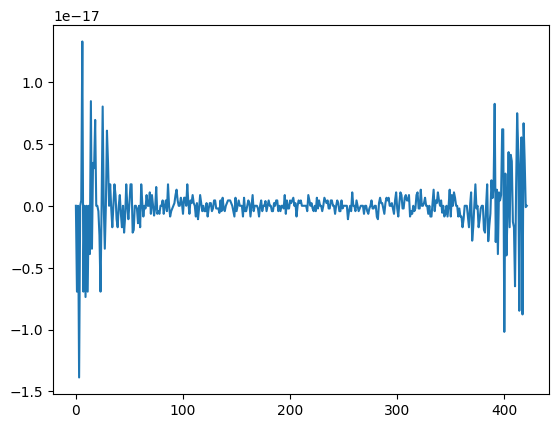

In [10]:
# Put it all together to get discrete laplacian
minv = np.diag(1/vertex_area)

n = np.diag((1/2)*(cota + cotb).sum(axis=1))

lap_unweighted = (1/2)*(cota + cotb) - n

lap = minv @ lap_unweighted

# plt.imshow(lap[:40,:40], cmap='gray')
# plt.colorbar()
# plt.show()

# plt.plot(lap[50,0:100]) # this looks good; close to discrete laplacian
# plt.show()
# plt.plot(lap[0,1:]) # this looks bad; way too much negative weight on self
# plt.show()
# maybe that's actually okay: since it has many adjacent points each one gets a less positive weight

# I believe I found and fixed the error: the row sum of each entry of the lap operator should be zero
# since the laplacian of a uniform field is zero.
# to achieve this, each diagonal is the negative sum of the other elements in that row.
# I was just doing the negative of the number of elements in that row, which isn't right
# (we also need to include cota, cotb, etc.)
# this seems to have resolved the trouble at the poles and I can see turing patterns now.

plt.plot(lap.sum(axis=1)) # this should be zero, and it is
plt.show()
# plt.plot(adj_cell_numbers)
# plt.plot(adj.sum(axis=1))
# plt.show()

In [11]:
# now try applying laplacian to data
lapu = lap@mesh['dist']
mesh.point_data['lapu'] = lapu

p = pv.Plotter(shape=(1,2), notebook=0)
p.add_mesh(mesh, scalars='dist', cmap='gray')

p.subplot(0,1)
p.add_mesh(mesh.copy(), scalars='lapu', cmap='gray', interpolation=1)
p.link_views()
p.view_isometric()
p.show()

# need to find why poles are negative
# one pole is at 0


Then try simple PDE to test.

In [12]:
# Diffusion - seems to work
# Diffusion plus logistic growth
nt = 20000
d = 0.01
a = 0.1
dt = 0.1

p = pv.Plotter(shape=(1,3), notebook=0)
p.add_mesh(mesh, scalars='dist', cmap='gray')


mesh.point_data['diff'] = mesh['dist'].copy()

for i in range(nt):
    u = mesh['diff']
    lapu = lap@u
    
    mesh.point_data['diff'] += d*lapu*dt + a*u*(1-u)*dt
    
    if i==int(nt/2):
        p.subplot(0,1)
        p.add_mesh(mesh.copy(), scalars='diff', cmap='gray')
        p.link_views()
        p.view_isometric()
    
    if i==nt-1:
        p.subplot(0,2)
        p.add_mesh(mesh.copy(), scalars='diff', cmap='gray')
        p.link_views()
        p.view_isometric()
        
p.show()

Now try full reaction-diffusion with Schnakenberg kinetics.

In [18]:
import scipy.sparse as sp

def step_se(u, v, a, b, nsteps=1):
    """
    Steps morphogen concentrations u and v forwards in time
    according to the system equations (SE).
    """
    
    for i in range(nsteps):
        # nonlinear reaction terms
        # for u: u(n)*u(n+1)*v(n)
        u_nonlin = sp.eye(nx)
        u_nonlin.setdiag(u*v)

        # for v: u(n)^2*v(n+1)
        v_nonlin = sp.eye(nx)
        v_nonlin.setdiag(u**2)


        # linear operators for gmres
        A_u = iden - dt*( du*lap/dx**2 - g*iden + g*u_nonlin )
        b_u = u + dt*g*a

        A_v = iden - dt*( dv*lap/dx**2 - g*v_nonlin )
        b_v = v + dt*g*b


        # Run GMRES to solve for next timestep
        u, info_u = sp.linalg.gmres(A_u, b_u)
        v, info_v = sp.linalg.gmres(A_v, b_v)

        
        # Should catch a convergence failure here using info_u and info_v
        if info_u>0 or info_v>0:
            print("Warning: GMRES convergence failed")
            
    return u, v
    
    
# forward problem params
nx = mesh.n_points
du = 1
dv = 10
g = 1000
a = 0.126779#*0.25
b = .792366
dt = 0.0001
dx = .05

# initialize near steady-state solution
u = np.ones(nx, dtype=float)*(a+b)
u[0] *= 1.1 # perturbation to test
v = np.ones(nx, dtype=float)*(b/(a+b)**2)

# finite difference for laplacian
# boundaries currently periodic 
# lap = sp.diags([-2,1,1,1,1], offsets=[0,1,-1,nx-1,1-nx], shape=(nx,nx)) / dx**2
# mesh laplacian constructed elsewhere

# identity matrix
iden = sp.eye(nx)


# integrate over time, solving using GMRES at each timestep
niter = 8000

u_stored = np.zeros((nx, niter+1))
u_stored[:,0] = u

v_stored = np.zeros((nx, niter+1))
v_stored[:,0] = v

# Set up plotting
p = pv.Plotter(shape=(1,4), notebook=0)
mesh.point_data['turing'] = u
p.add_mesh(mesh.copy(), scalars='turing', cmap='gray')

def plot_mesh(u, subplot):
    mesh.point_data['turing'] = u
    p.subplot(0,subplot)
    p.add_mesh(mesh.copy(), scalars='turing', cmap='gray')
    p.link_views()
    p.view_isometric()
    
# run time loop
for i in range(niter):
    # Run GMRES to solve for next timestep
    u, v = step_se(u,v, a,b)

    # store for later animation
    u_stored[:,i+1] = u
    v_stored[:,i+1] = v
    
    if i%500 == 0: print(i)

    
    if i==int(niter/3):
        plot_mesh(u, 1)
        
    if i==int(niter*2/3):
        plot_mesh(u, 2)
    
    if i==niter-1:
        plot_mesh(u, 3)

# p = pv.Plotter(shape=(1,1), notebook=0)
# mesh.point_data['turing'] = u
# p.add_mesh(mesh, scalars='turing', cmap='gray')      
p.show()

# plt.show()
# print(u, info)

0
500
1000


KeyboardInterrupt: 

In [14]:
from animation import animate_2d_array

animate_2d_array(u_stored[:,::10], interval=1)

# plt.plot(u_stored[1,:])
# plt.show()